# Class-Conditional Synthesis with Latent Diffusion Models

# 경로 무조건 바꿔야 함!!!!!!

Install all the requirements

In [1]:
#@title Installation
#한번만 실행하기!!!!!!
#!git clone https://github.com/CompVis/latent-diffusion.git
#!git clone https://github.com/CompVis/taming-transformers
#!pip install -e ./taming-transformers
#!pip install omegaconf>=2.0.0 pytorch-lightning>=1.0.8 torch-fidelity einops

fatal: destination path 'latent-diffusion' already exists and is not an empty directory.
fatal: destination path 'taming-transformers' already exists and is not an empty directory.
Obtaining file:///home/Chaehyun/latent-diffusion/scripts/taming-transformers
  Attempting uninstall: taming-transformers
    Found existing installation: taming-transformers 0.0.1
    Uninstalling taming-transformers-0.0.1:
      Successfully uninstalled taming-transformers-0.0.1
  Running setup.py develop for taming-transformers


In [1]:
import sys
sys.path.append(".")
sys.path.append('./taming-transformers')

In [2]:
from taming.models import vqgan 

2024-03-16 16:36:51.805001: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-16 16:36:51.916833: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-03-16 16:36:51.920044: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/cuda-12.2/lib64:
2024-03-16 16:36:51.920066: I tensorflow/compiler/xla/s

Now, download the checkpoint (~1.7 GB). This will usually take 1-2 minutes.

In [3]:
#@title Download
#한번만 실행하기!!!!!!
#%cd latent-diffusion/ 

#!mkdir -p models/ldm/cin256-v2/
#!wget -O models/ldm/cin256-v2/model.ckpt https://ommer-lab.com/files/latent-diffusion/nitro/cin/model.ckpt 

/home/Chaehyun/latent-diffusion/scripts/latent-diffusion
--2024-03-04 21:58:34--  https://ommer-lab.com/files/latent-diffusion/nitro/cin/model.ckpt
Resolving ommer-lab.com (ommer-lab.com)... 141.84.41.65
Connecting to ommer-lab.com (ommer-lab.com)|141.84.41.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1827378153 (1.7G)
Saving to: ‘models/ldm/cin256-v2/model.ckpt’

models/ldm/cin256-v 100%[===================>]   1.70G  8.22MB/s    in 3m 40s  

2024-03-04 22:02:15 (7.94 MB/s) - ‘models/ldm/cin256-v2/model.ckpt’ saved [1827378153/1827378153]



Let's also check what type of GPU we've got.

In [3]:
!nvidia-smi

Wed Mar 13 20:48:21 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.113.01             Driver Version: 535.113.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA GeForce RTX 2080 Ti     Off | 00000000:19:00.0 Off |                  N/A |
| 30%   27C    P8              12W / 250W |      6MiB / 11264MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

Load it.

In [3]:
#@title loading utils
import torch
from omegaconf import OmegaConf

from ldm.util import instantiate_from_config


def load_model_from_config(config, ckpt):
    print(f"Loading model from {ckpt}")
    pl_sd = torch.load(ckpt)#, map_location="cpu")
    sd = pl_sd["state_dict"]
    model = instantiate_from_config(config.model)
    m, u = model.load_state_dict(sd, strict=False)
    model.cuda()
    model.eval()
    return model


def get_model():
    ##############
    # 경로 바꾸기 #
    ##############
    config = OmegaConf.load("/home/Chaehyun/latent-diffusion/scripts/latent-diffusion/configs/latent-diffusion/cin256-v2.yaml")  
    model = load_model_from_config(config, "/home/Chaehyun/latent-diffusion/scripts/latent-diffusion/models/ldm/cin256-v2/model.ckpt")
    return model

In [4]:
from ldm.models.diffusion.ddim import DDIMSampler

model = get_model()
sampler = DDIMSampler(model)

Loading model from /home/Chaehyun/latent-diffusion/scripts/latent-diffusion/models/ldm/cin256-v2/model.ckpt
LatentDiffusion: Running in eps-prediction mode
DiffusionWrapper has 400.92 M params.
making attention of type 'vanilla' with 512 in_channels
Working with z of shape (1, 3, 64, 64) = 12288 dimensions.
making attention of type 'vanilla' with 512 in_channels


And go. Quality, sampling speed and diversity are best controlled via the `scale`, `ddim_steps` and `ddim_eta` variables. As a rule of thumb, higher values of `scale` produce better samples at the cost of a reduced output diversity. Furthermore, increasing `ddim_steps` generally also gives higher quality samples, but returns are diminishing for values > 250. Fast sampling (i e. low values of `ddim_steps`) while retaining good quality can be achieved by using `ddim_eta = 0.0`.

rendering 6 examples of class '187' in 20 steps and using s=3.00.
Data shape for DDIM sampling is (6, 3, 64, 64), eta 0.0
Running DDIM Sampling with 20 timesteps


DDIM Sampler: 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]


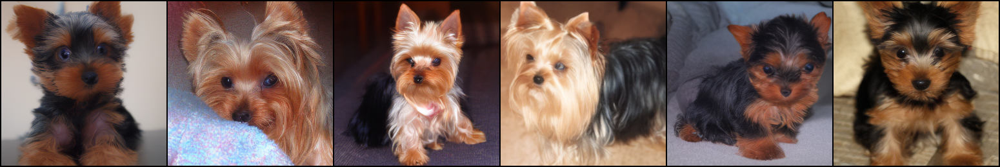

In [5]:
import numpy as np 
from PIL import Image
from einops import rearrange
from torchvision.utils import make_grid


classes = [187] #, 25, 448, 992]   # define classes to be sampled here
n_samples_per_class = 6

ddim_steps = 20
ddim_eta = 0.0
scale = 3.0   # for unconditional guidance


all_samples = list()

with torch.no_grad():
    with model.ema_scope():
        uc = model.get_learned_conditioning(
            {model.cond_stage_key: torch.tensor(n_samples_per_class*[1000]).to(model.device)}
            )
        
        for class_label in classes:
            print(f"rendering {n_samples_per_class} examples of class '{class_label}' in {ddim_steps} steps and using s={scale:.2f}.")
            xc = torch.tensor(n_samples_per_class*[class_label])
            c = model.get_learned_conditioning({model.cond_stage_key: xc.to(model.device)})
            
            samples_ddim, _ = sampler.sample(S=ddim_steps,
                                             conditioning=c,
                                             batch_size=n_samples_per_class,
                                             shape=[3, 64, 64],
                                             verbose=False,
                                             unconditional_guidance_scale=scale,
                                             unconditional_conditioning=uc, 
                                             eta=ddim_eta)

            x_samples_ddim = model.decode_first_stage(samples_ddim)
            x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0, 
                                         min=0.0, max=1.0)
            all_samples.append(x_samples_ddim)


# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

In [6]:
samples_ddim.shape

torch.Size([6, 3, 64, 64])

In [7]:
len(model.my_attn) # cc_attention, x, out -> dictionary

3

In [8]:
model.my_attn

{'cc_attention': [tensor([[[ 0.8944,  1.8085, -0.6928,  ..., -0.4498, -0.5359, -0.3331]],
  
          [[ 0.8944,  1.8085, -0.6928,  ..., -0.4498, -0.5359, -0.3331]],
  
          [[ 0.8944,  1.8085, -0.6928,  ..., -0.4498, -0.5359, -0.3331]],
  
          ...,
  
          [[ 0.2796,  0.3964,  0.0515,  ..., -1.3417,  1.0975,  0.4131]],
  
          [[ 0.2796,  0.3964,  0.0515,  ..., -1.3417,  1.0975,  0.4131]],
  
          [[ 0.2796,  0.3964,  0.0515,  ..., -1.3417,  1.0975,  0.4131]]],
         device='cuda:0'),
  tensor([[[ 0.8944,  1.8085, -0.6928,  ..., -0.4498, -0.5359, -0.3331]],
  
          [[ 0.8944,  1.8085, -0.6928,  ..., -0.4498, -0.5359, -0.3331]],
  
          [[ 0.8944,  1.8085, -0.6928,  ..., -0.4498, -0.5359, -0.3331]],
  
          ...,
  
          [[ 0.2796,  0.3964,  0.0515,  ..., -1.3417,  1.0975,  0.4131]],
  
          [[ 0.2796,  0.3964,  0.0515,  ..., -1.3417,  1.0975,  0.4131]],
  
          [[ 0.2796,  0.3964,  0.0515,  ..., -1.3417,  1.0975,  0.4131]]],
 

In [9]:
import matplotlib.pyplot as plt

In [10]:
model.my_attn['out'] # diffusion step, batch, channel, h ,w 

[tensor([[[[ 1.2487e+00, -1.2195e+00,  1.5872e+00,  ..., -8.1104e-01,
             9.8929e-01,  1.5991e+00],
           [-1.2264e-01,  1.4542e+00, -8.6844e-01,  ...,  6.3563e-01,
             4.8331e-01, -2.4218e+00],
           [ 4.0976e-01,  1.0117e+00,  1.3816e+00,  ..., -1.6388e+00,
            -2.4895e-01,  1.0774e+00],
           ...,
           [-4.0916e-01,  7.1653e-01,  5.5258e-01,  ...,  9.1960e-01,
            -4.5852e-01,  4.4267e-01],
           [ 1.3432e+00, -2.2901e+00, -1.1857e+00,  ..., -1.8884e+00,
            -5.6782e-01,  1.0520e-02],
           [-1.5653e+00,  4.8522e-01,  1.0135e+00,  ..., -2.0253e+00,
            -1.0802e+00,  6.8709e-01]],
 
          [[ 5.0869e-01,  5.1908e-01,  5.1388e-01,  ...,  5.3287e-01,
            -1.7175e+00,  5.9332e-01],
           [-5.5514e-01, -6.5242e-01, -1.2247e+00,  ...,  1.9334e+00,
             1.3934e+00, -1.7706e-01],
           [ 1.6829e+00, -1.3559e+00,  4.7289e-01,  ..., -1.3446e+00,
            -1.1250e+00,  5.9055e-01],


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


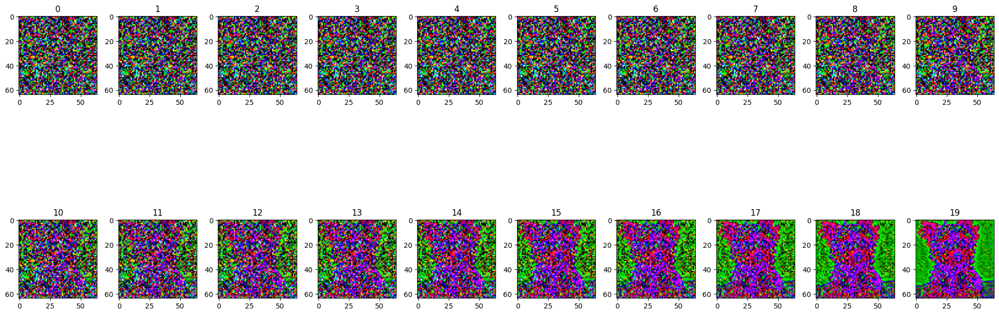

In [11]:
f,ax = plt.subplots(2,10,figsize=(20,10))
for i in range(2):
    for j in range(10):
        ax[i,j].imshow(model.my_attn['x'][i*10+ j][0].detach().cpu().permute(1,2,0).numpy())
        ax[i,j].set_title(i*10+j)
plt.tight_layout()
plt.show()

In [12]:
model.my_attn['cc_attention'][0].shape

torch.Size([12, 1, 512])

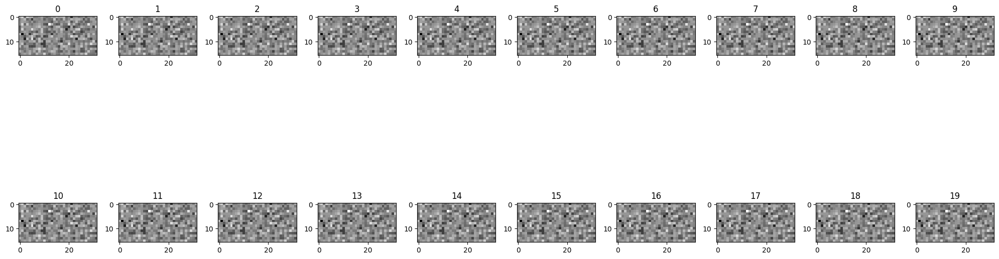

In [13]:
f,ax = plt.subplots(2,10,figsize=(20,10))
for i in range(2):
    for j in range(10):
        ax[i,j].imshow(model.my_attn['cc_attention'][i*10+j][0].detach().cpu().numpy().reshape(16,32), cmap='gray')
        ax[i,j].set_title(i*10+j)
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

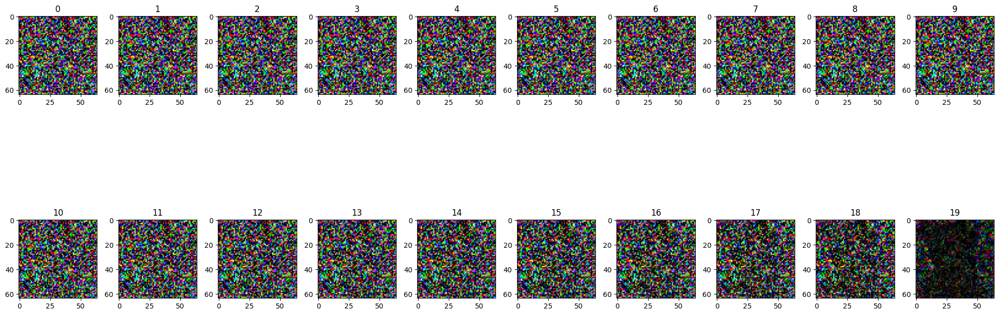

In [14]:
f,ax = plt.subplots(2,10,figsize=(20,10))
for i in range(2):
    for j in range(10):
        ax[i,j].imshow(model.my_attn['out'][i*10+ j][0].detach().cpu().permute(1,2,0).numpy())
        ax[i,j].set_title(i*10+j)
plt.tight_layout()
plt.show()

### decoder -  아직 못함

In [15]:
model.my_attn['out'][19].shape

torch.Size([12, 3, 64, 64])

In [27]:
all_samples = list()
x_samples_ddim = model.decode_first_stage(model.my_attn['x'][19])
x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0, min=0.0, max=1.0)
all_samples.append(x_samples_ddim)

In [28]:
all_samples[0].shape

torch.Size([12, 3, 256, 256])

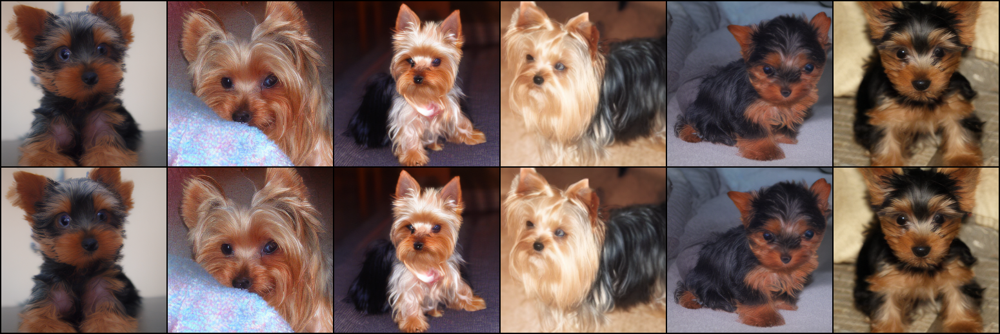

In [18]:
# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

In [24]:
grid.shape

(518, 1550, 3)

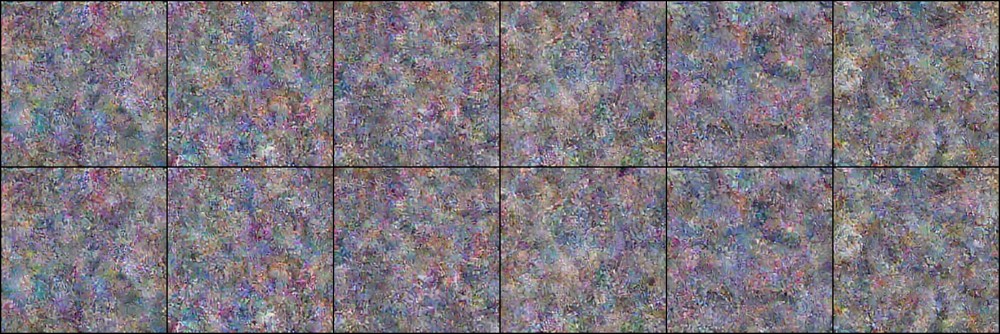

In [43]:
all_samples = list()
x_samples_ddim = model.decode_first_stage(model.my_attn['x'][0])
x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0, min=0.0, max=1.0)
all_samples.append(x_samples_ddim)

# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

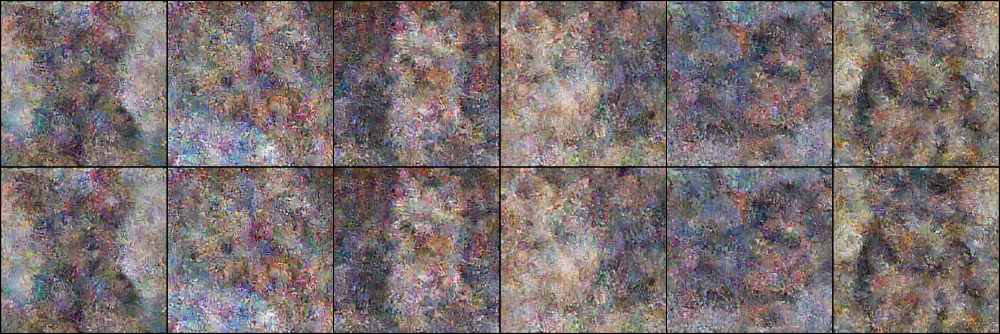

In [69]:
all_samples = list()
x_samples_ddim = model.decode_first_stage(model.my_attn['x'][9])
x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0, min=0.0, max=1.0)
all_samples.append(x_samples_ddim)

# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

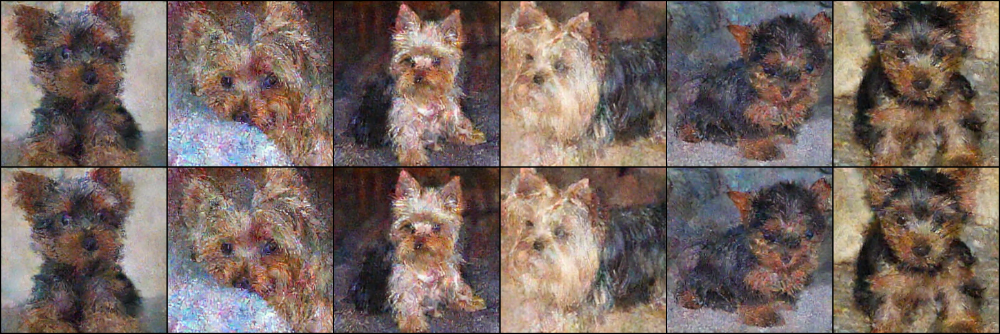

In [51]:
all_samples = list()
x_samples_ddim = model.decode_first_stage(model.my_attn['x'][14])
x_samples_ddim = torch.clamp((x_samples_ddim+1.0)/2.0, min=0.0, max=1.0)
all_samples.append(x_samples_ddim)

# display as grid
grid = torch.stack(all_samples, 0)
grid = rearrange(grid, 'n b c h w -> (n b) c h w')
grid = make_grid(grid, nrow=n_samples_per_class)

# to image
grid = 255. * rearrange(grid, 'c h w -> h w c').cpu().numpy()
Image.fromarray(grid.astype(np.uint8))

In [54]:
model.my_attn['x'][19][0].shape

torch.Size([3, 64, 64])

### 분포

In [121]:
# x와 out의 분포 차이: CE
import torch
from typing import List

def CE(idx:int)->List[float]:
    criterion = torch.nn.CrossEntropyLoss()
    ce_list = []
    
    bin1 = criterion(model.my_attn['x'][0][idx], model.my_attn['x'][7][idx])
    ce_list.append(bin1.cpu().numpy())
    bin2 = criterion(model.my_attn['x'][7][idx], model.my_attn['x'][14][idx])
    ce_list.append(bin2.cpu().numpy())
    bin3 = criterion(model.my_attn['x'][14][idx], model.my_attn['x'][19][idx])
    ce_list.append(bin3.cpu().numpy())
    
    return ce_list

ce_list1 = CE(0)

ce_list = [ce_list1]
x = range(1, 21)

In [122]:
ce_list[0][0]

array(-54.5769, dtype=float32)

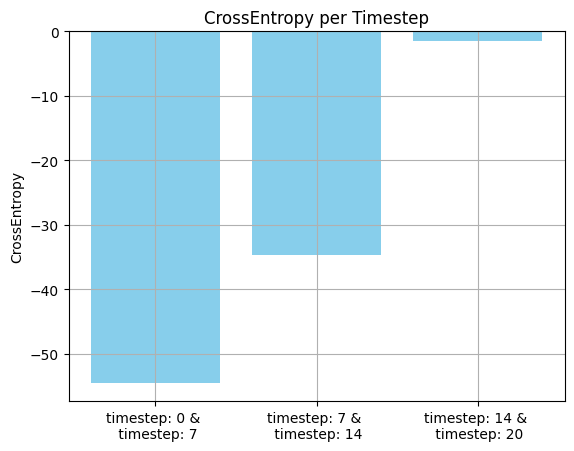

In [130]:
data = np.array([-54.5769, -34.632057, -1.5083288])
labels = ['timestep: 0 & \n timestep: 7', 'timestep: 7 & \n timestep: 14', 'timestep: 14 & \n timestep: 20']

plt.bar(labels, data, color='skyblue')
plt.ylabel('CrossEntropy')
plt.title('CrossEntropy per Timestep')
plt.grid(True)
plt.show()

In [124]:
# KL divergence
def KL_D(x:torch.Tensor, out:torch.Tensor)->float:

    softmax = torch.nn.Softmax(dim=0)
    p = softmax(x)
    q = softmax(out)

    log_p = torch.log(p)
    log_q = torch.log(q)
    
    kl_divergence = torch.sum(p * (log_p - log_q))
    return kl_divergence.item()


def make_KL_for_images(idx:int)->List[float]:
    KL_list = []
    
    KL_list.append(KL_D(model.my_attn['x'][0][idx], model.my_attn['x'][7][idx]))
    KL_list.append(KL_D(model.my_attn['x'][7][idx], model.my_attn['x'][14][idx]))
    KL_list.append(KL_D(model.my_attn['x'][14][idx], model.my_attn['x'][19][idx]))

    return KL_list

kl_list1 = make_KL_for_images(0)

In [125]:
kl_list1

[9.643420219421387, 152.22581481933594, 220.572265625]

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


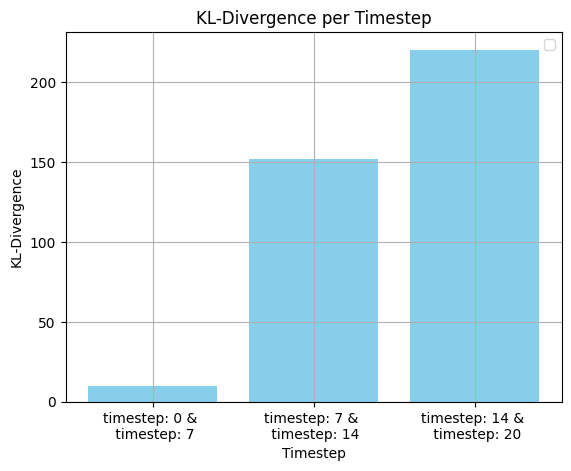

In [128]:
data = [9.643420219421387, 152.22581481933594, 220.572265625]
labels = ['timestep: 0 & \n timestep: 7', 'timestep: 7 & \n timestep: 14', 'timestep: 14 & \n timestep: 20']

plt.bar(labels, data, color='skyblue')

plt.title('KL-Divergence per Timestep')
plt.xlabel('Timestep')
plt.ylabel('KL-Divergence')
plt.legend()
plt.grid(True)
plt.show()

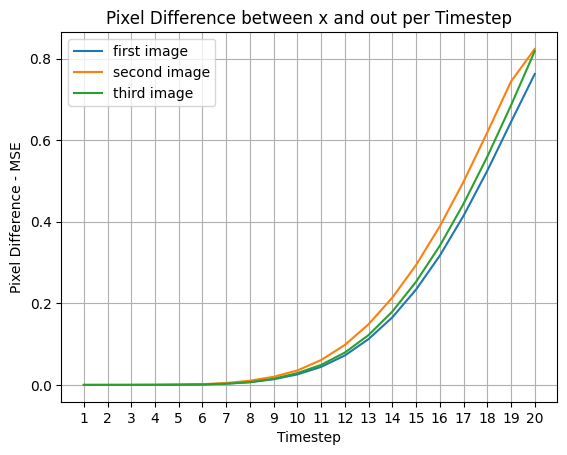

In [17]:
# 픽셀 차이: mse
# KL divergence
def mse_loss(x:torch.Tensor, out:torch.Tensor)->float:

    diff = out - x
    squared_diff = diff ** 2
    mse = torch.mean(squared_diff)
    
    return mse.item()


def pixel_difference(idx:int)->List[float]:
    mse_list = []
    for i in range(2):
        for j in range(10):
            mse_list.append(mse_loss(model.my_attn['x'][i*10+ j][idx], model.my_attn['out'][i*10+ j][idx]))

    return mse_list

mse_list1 = pixel_difference(0)
mse_list2 = pixel_difference(1)
mse_list3 = pixel_difference(2)

mse_list = [mse_list1, mse_list2, mse_list3]
x = range(1, 21)

# 각 kl_list를 plot으로 그리기
plt.plot(x, mse_list[0], label='first image')
plt.plot(x, mse_list[1], label='second image')
plt.plot(x, mse_list[2], label='third image')

plt.title('Pixel Difference between x and out per Timestep')
plt.xlabel('Timestep')
plt.ylabel('Pixel Difference - MSE')
plt.legend()
plt.grid(True)
plt.xticks(range(1, 21))
plt.show()

### x와 out의 diffusion step마다의 분포

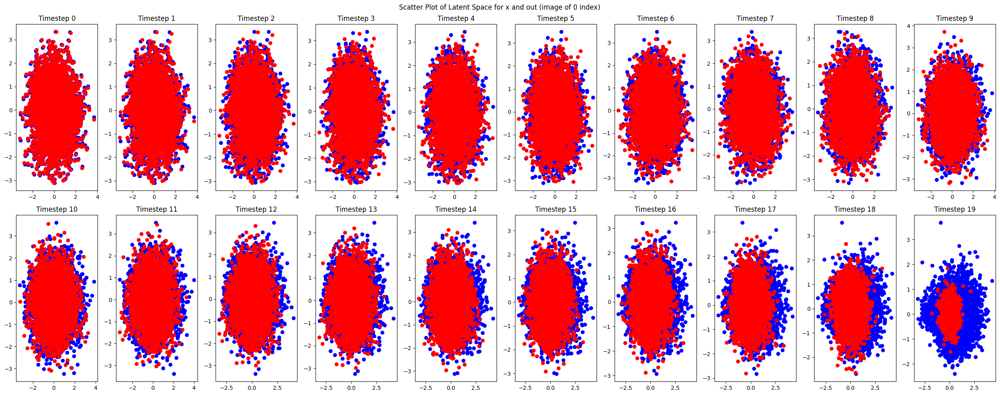

In [55]:
# using PCA
# 0번째 이미지에 대해서만 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

f,ax = plt.subplots(2,10,figsize=(25,10))

for i in range(2):
    for j in range(10):
        data_x = model.my_attn['x'][i*10+ j][0].detach().cpu().numpy().reshape(-1, 64*64)
        data_out = model.my_attn['out'][i*10+ j][0].detach().cpu().numpy().reshape(-1, 64*64)
        pca = PCA(n_components=2)
        data_2d_x = pca.fit_transform(data_x.T)
        data_2d_out = pca.fit_transform(data_out.T)

        ax[i,j].scatter(data_2d_x[:, 0], data_2d_x[:, 1], c='b', label='x')
        ax[i,j].scatter(data_2d_out[:, 0], data_2d_out[:, 1], c='r', label='out')
        ax[i,j].set_title('Timestep {}'.format(i*10 + j))

plt.suptitle('Scatter Plot of Latent Space for x and out (image of 0 index)')
plt.tight_layout()
plt.show()

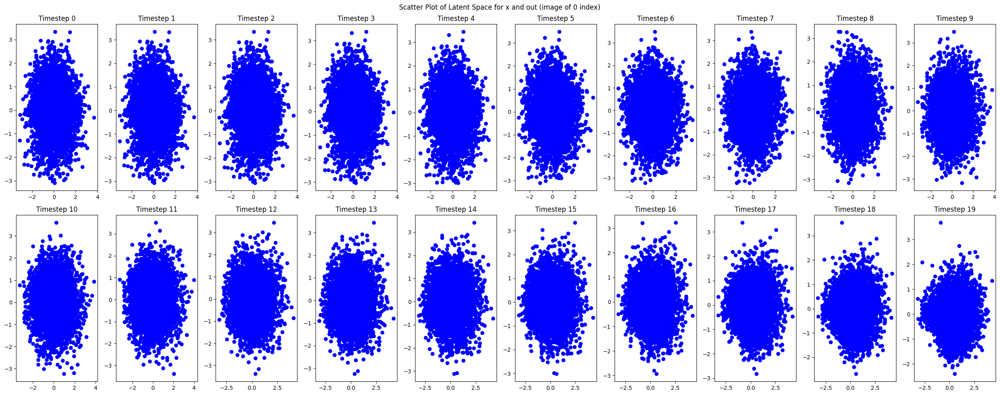

In [59]:
# using PCA
# 0번째 이미지에 대해서만 
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

f,ax = plt.subplots(2,10,figsize=(25,10))

for i in range(2):
    for j in range(10):
        data_x = model.my_attn['x'][i*10+ j][0].detach().cpu().numpy().reshape(-1, 64*64)
        data_out = model.my_attn['out'][i*10+ j][0].detach().cpu().numpy().reshape(-1, 64*64)
        pca = PCA(n_components=2)
        data_2d_x = pca.fit_transform(data_x.T)
        data_2d_out = pca.fit_transform(data_out.T)

        ax[i,j].scatter(data_2d_x[:, 0], data_2d_x[:, 1], c='b', label='x')
        #ax[i,j].scatter(data_2d_out[:, 0], data_2d_out[:, 1], c='g', label='out')
        ax[i,j].set_title('Timestep {}'.format(i*10 + j))

plt.suptitle('Scatter Plot of Latent Space for x and out (image of 0 index)')
plt.tight_layout()
plt.show()

/home/Chaehyun/anaconda3/envs/ldm/lib/python3.8/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/Chaehyun/anaconda3/envs/ldm/lib/python3.8/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/Chaehyun/anaconda3/envs/ldm/lib/python3.8/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/Chaehyun/anaconda3/envs/ldm/lib/python3.8/site-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


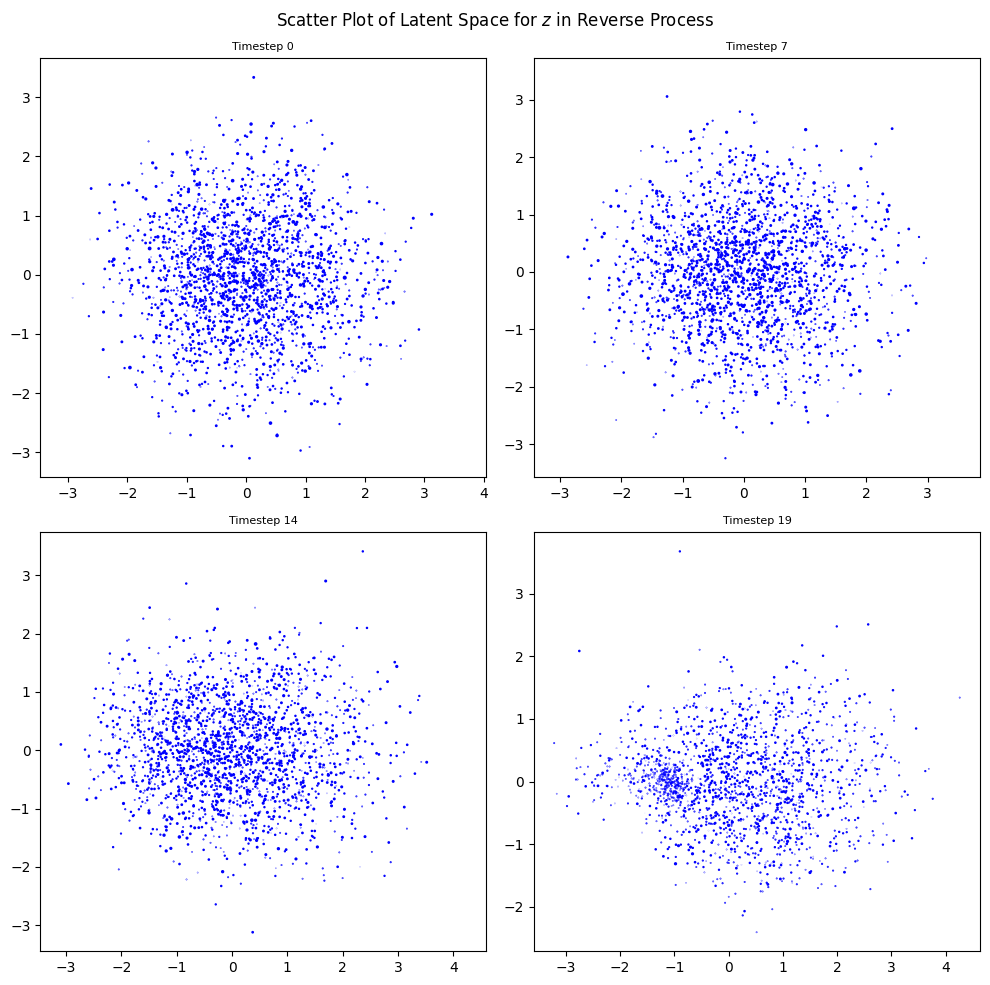

In [107]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

f, ax = plt.subplots(2, 2, figsize=(10, 10))
k=0

for i in range(2):
    for j in range(10):
        if (i*10+j) in [0, 7, 14, 19]:
            data_x = model.my_attn['x'][i * 10 + j][0].detach().cpu().numpy().reshape(-1, 64 * 64)
            pca = PCA(n_components=3)
            data_3d_x = pca.fit_transform(data_x.T)

            ax[i, k].scatter(data_3d_x[:, 0], data_3d_x[:, 1], data_3d_x[:, 2], c='b', label='x')
            ax[i, k].set_title('Timestep {}'.format(i * 10 + j), fontsize=8)
        
        if k == 0: k=1
        else: k=0

plt.suptitle('Scatter Plot of Latent Space for $z$ in Reverse Process')
plt.tight_layout()
plt.show()

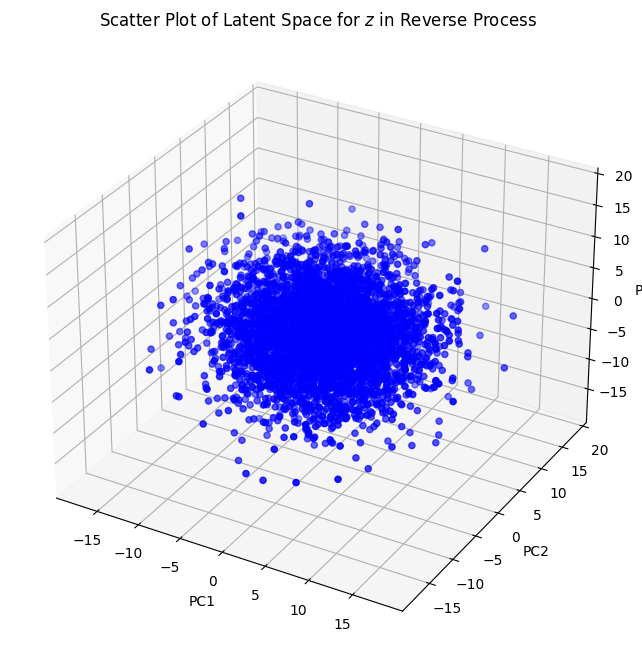

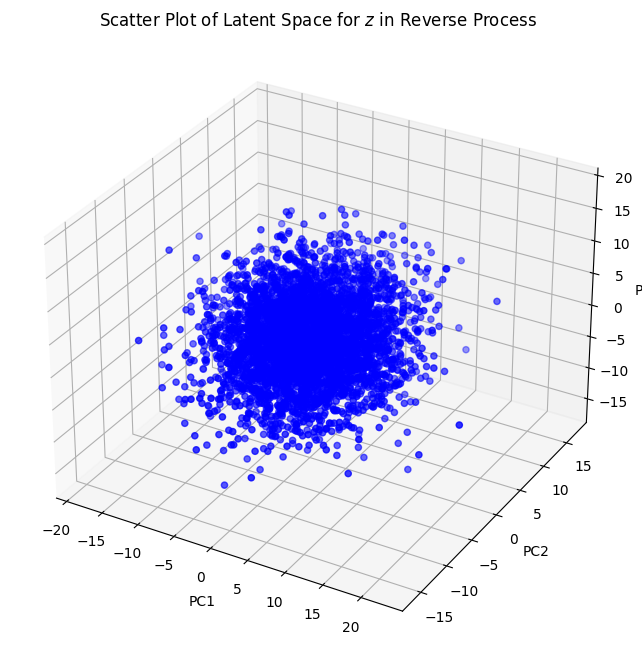

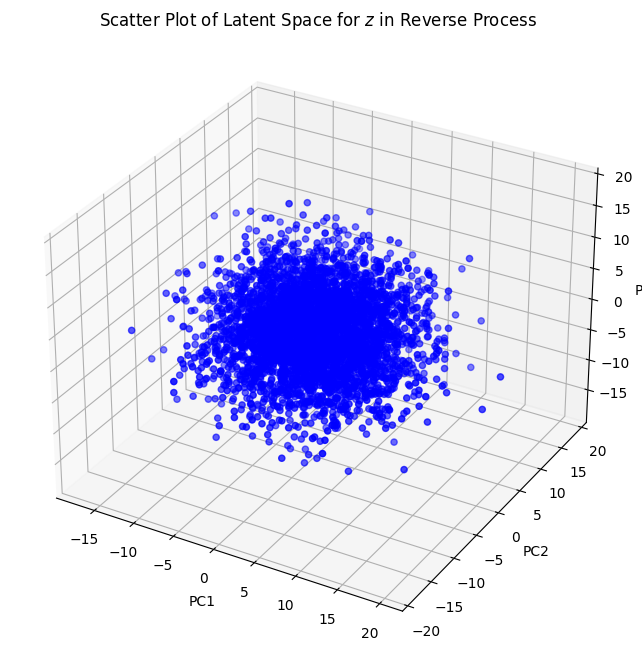

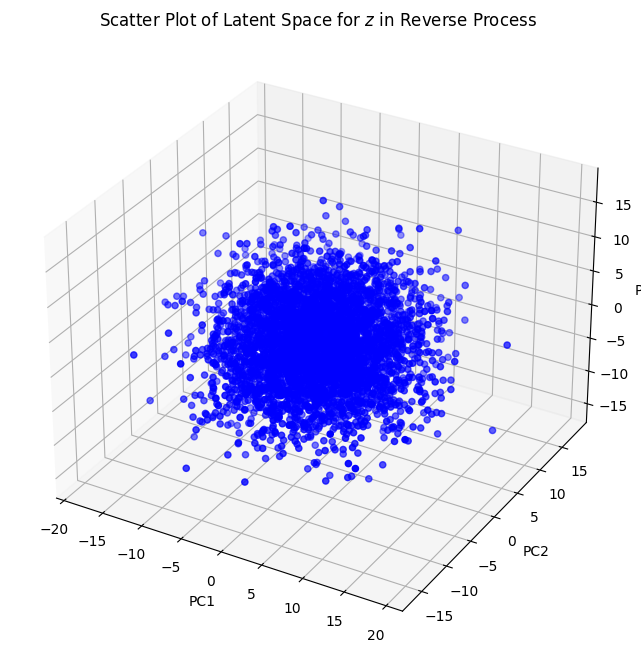

In [104]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # 3D plotting
from sklearn.decomposition import PCA

# Assuming 'model.my_attn['x']' contains your data

# Combine all data points into a single array for PCA
for i in range(0, 20):
    if i in [0, 7, 14, 19]:
        combined_data = np.concatenate([model.my_attn['x'][i][0].detach().cpu().numpy().reshape(-1, 64 * 64) for i in range(len(model.my_attn['x']))], axis=0)

        # Perform PCA on the combined data
        pca = PCA(n_components=3)
        data_3d_combined = pca.fit_transform(combined_data.T)

        # Plotting
        fig = plt.figure(figsize=(10, 8))
        ax = fig.add_subplot(111, projection='3d')

        # Scatter plot for combined data
        ax.scatter(data_3d_combined[:, 0], data_3d_combined[:, 1], data_3d_combined[:, 2], c='b', label='Latent Space')

        ax.set_xlabel('PC1')
        ax.set_ylabel('PC2')
        ax.set_zlabel('PC3')
        ax.set_title('Scatter Plot of Latent Space for $z$ in Reverse Process')

        plt.show()


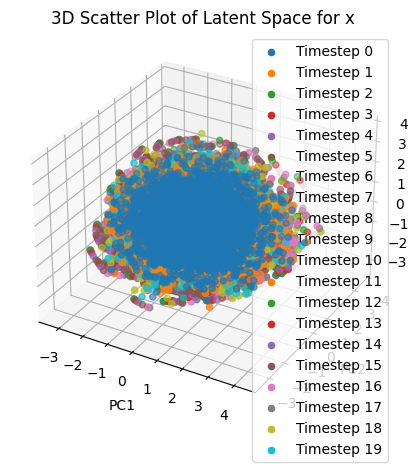

In [78]:
# 3D scatter plot
fig = plt.figure(figsize=(10, 5))
ax_3d = fig.add_subplot(111, projection='3d')

for i in range(2):
    for j in range(10):
        data_x = model.my_attn['x'][i * 10 + j][0].detach().cpu().numpy().reshape(-1, 64 * 64)
        pca = PCA(n_components=3)
        data_3d_x = pca.fit_transform(data_x.T)

        ax_3d.scatter(data_3d_x[:, 0], data_3d_x[:, 1], data_3d_x[:, 2], label='Timestep {}'.format(i * 10 + j))

ax_3d.set_xlabel('PC1')
ax_3d.set_ylabel('PC2')
ax_3d.set_zlabel('PC3')
ax_3d.set_title('3D Scatter Plot of Latent Space for x')
ax_3d.legend()

plt.show()

In [90]:
model.my_attn['x'][0].shape

torch.Size([12, 3, 64, 64])

1. 위에 한 것 out, x, cc 시각화 해보고 분석해보기
2. decoder 통과해보기 
3. x, out의 분포 차이 / 픽셀 차이 / bpd 계산....
4. x와 out의 diffusion step마다 t-sne 해보기 (x와 out이 같은 manifold 상에 있으면 좋겠다.)

noise와 image의 tsne가 다른지 확인해보기. 달라야 함(같은 manifold안에 noise와 pixel 두 개가 같이 존재하지 않는다.)
만약 둘이 비슷해 보인다면 같은 manifold안에 noise와 pixel 두 개가 같이 존재한다. 